In [125]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_profiling as pp
import matplotlib.pyplot as plt
import tensorflow as tf
import warnings
warnings.filterwarnings('ignore')
sns.set()

from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron

In [3]:
features = [ 'fLength', 'fWidth', 'fSize', 'fConc', 'fConc1', 'fAsym', 'fM3Long', 'fM3Trans', 'fAlpha', 'fDist' ]
df = pd. read_csv('telescope_data.csv')

In [4]:
df

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g
...,...,...,...,...,...,...,...,...,...,...,...
19015,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,h
19016,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,h
19017,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,h
19018,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,h


In [5]:
df.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19020 entries, 0 to 19019
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   fLength   19020 non-null  float64
 1   fWidth    19020 non-null  float64
 2   fSize     19020 non-null  float64
 3   fConc     19020 non-null  float64
 4   fConc1    19020 non-null  float64
 5   fAsym     19020 non-null  float64
 6   fM3Long   19020 non-null  float64
 7   fM3Trans  19020 non-null  float64
 8   fAlpha    19020 non-null  float64
 9   fDist     19020 non-null  float64
 10  class     19020 non-null  object 
dtypes: float64(10), object(1)
memory usage: 1.6+ MB


In [7]:
df.describe()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist
count,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000
mean,53.250154,22.180966,2.825017,0.380327,0.214657,-4.331745,10.545545,0.249726,27.645707,193.818026
std,42.364855,18.346056,0.472599,0.182813,0.110511,59.206062,51.000118,20.827439,26.103621,74.731787
min,4.283500,0.000000,1.941300,0.013100,0.000300,-457.916100,-331.780000,-205.894700,0.000000,1.282600
25%,24.336000,11.863800,2.477100,0.235800,0.128475,-20.586550,-12.842775,-10.849375,5.547925,142.492250
50%,37.147700,17.139900,2.739600,0.354150,0.196500,4.013050,15.314100,0.666200,17.679500,191.851450
75%,70.122175,24.739475,3.101600,0.503700,0.285225,24.063700,35.837800,10.946425,45.883550,240.563825
max,334.177000,256.382000,5.323300,0.893000,0.675200,575.240700,238.321000,179.851000,90.000000,495.561000


In [8]:
pp.ProfileReport(df, title = 'Pandas Profiling report of "MAGIC Telescope Dataset"', html = {'style':{'full_width': True}})

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
df.isnull().sum()

fLength     0
fWidth      0
fSize       0
fConc       0
fConc1      0
fAsym       0
fM3Long     0
fM3Trans    0
fAlpha      0
fDist       0
class       0
dtype: int64

Text(0.5, 1.0, 'Class Counts')

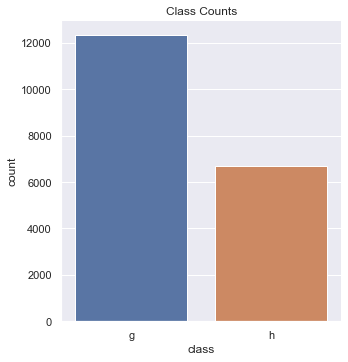

In [10]:
# Target Class
sns.catplot(x = 'class', kind='count', data = df)
plt.title('Class Counts')

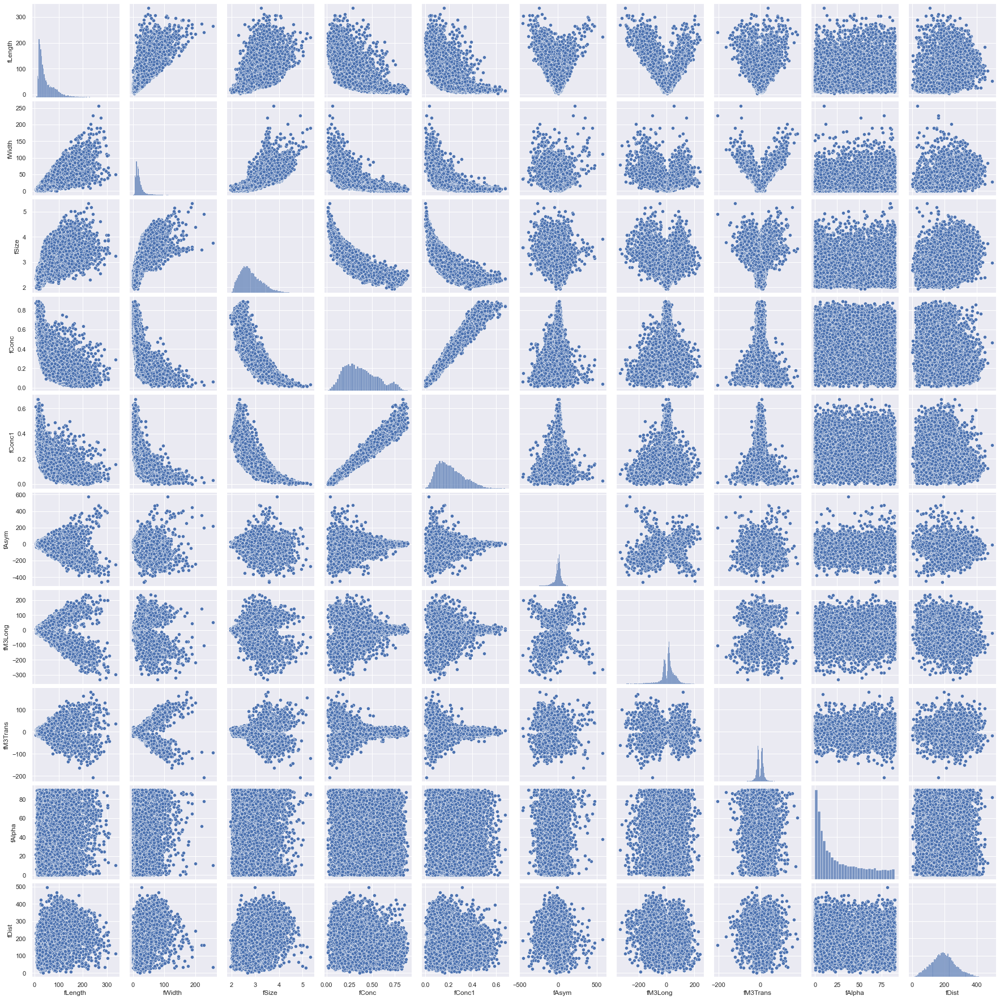

In [11]:
sns.pairplot(df)
plt.show()

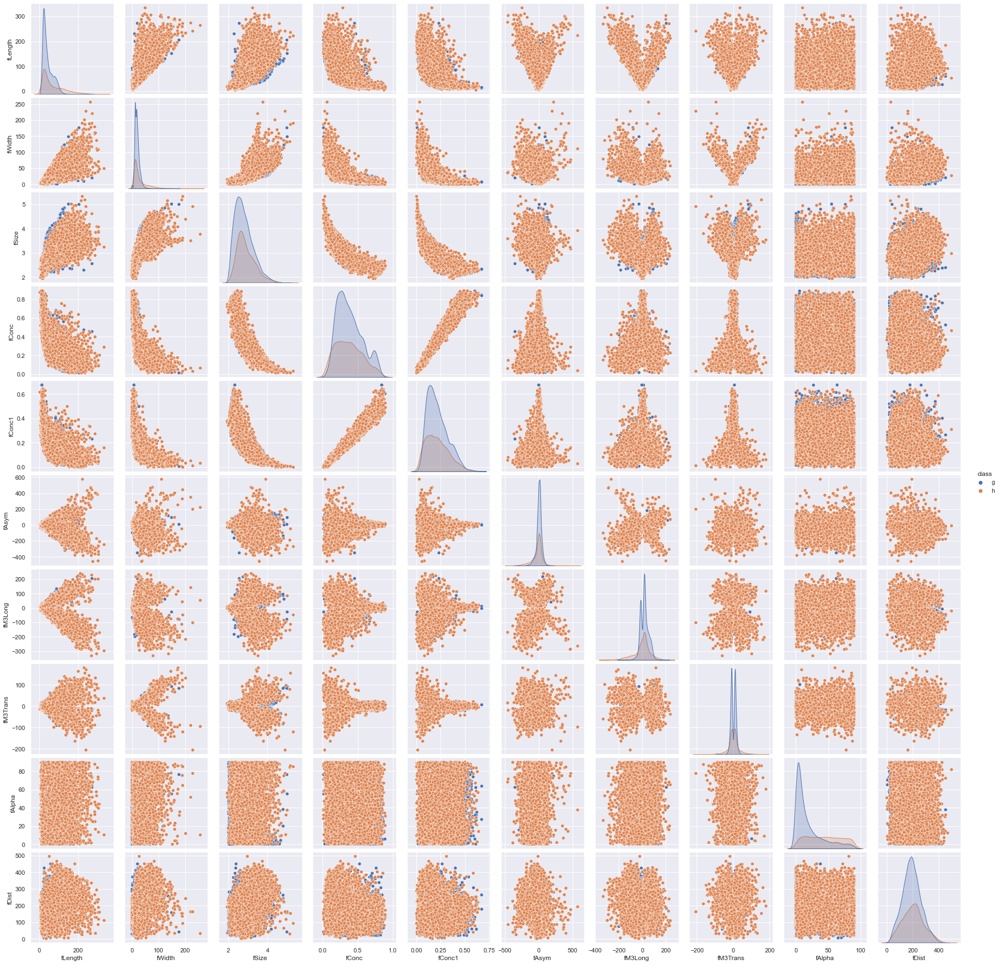

In [12]:
sns.pairplot(df, hue='class')

In [13]:
df[df['class']=='g'].head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g


In [14]:
df[df['class']=='h'].head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
12332,93.7035,37.9432,3.1454,0.1680,0.1011,53.2566,89.0566,11.8175,14.1224,231.9028,h
12333,102.0005,22.0017,3.3161,0.1064,0.0724,-54.0862,43.0553,-15.0647,88.4636,274.9392,h
12334,100.2775,21.8784,3.1100,0.3120,0.1446,-48.1834,57.6547,-9.6341,20.7848,346.4330,h
12335,91.6558,18.8293,2.7097,0.4386,0.3420,-52.6841,-97.8373,-17.0955,63.8834,130.7998,h
12336,38.0195,12.6736,2.8747,0.4084,0.1928,-51.4840,8.3471,7.9620,24.5402,163.8674,h


In [15]:
df_g = df[df['class']=='g']
df_h = df[df['class']=='h']

array([[<AxesSubplot:title={'center':'fLength'}>,
        <AxesSubplot:title={'center':'fWidth'}>,
        <AxesSubplot:title={'center':'fSize'}>],
       [<AxesSubplot:title={'center':'fConc'}>,
        <AxesSubplot:title={'center':'fConc1'}>,
        <AxesSubplot:title={'center':'fAsym'}>],
       [<AxesSubplot:title={'center':'fM3Long'}>,
        <AxesSubplot:title={'center':'fM3Trans'}>,
        <AxesSubplot:title={'center':'fAlpha'}>],
       [<AxesSubplot:title={'center':'fDist'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

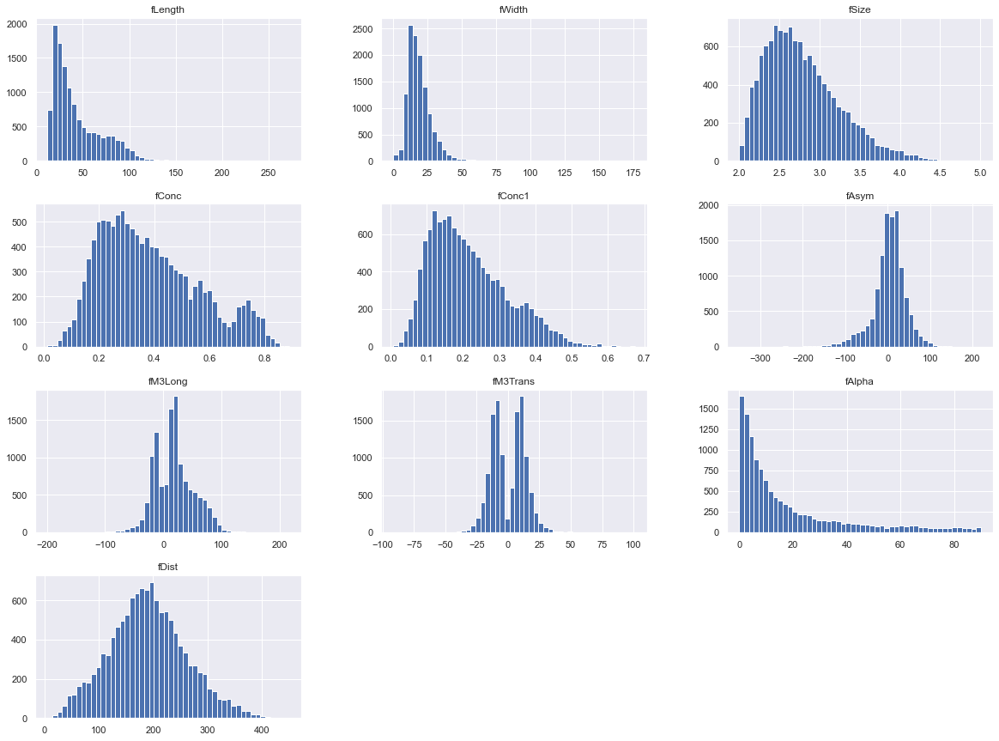

In [16]:
df_g.hist(bins = 50, figsize=(20,15))

array([[<AxesSubplot:title={'center':'fLength'}>,
        <AxesSubplot:title={'center':'fWidth'}>,
        <AxesSubplot:title={'center':'fSize'}>],
       [<AxesSubplot:title={'center':'fConc'}>,
        <AxesSubplot:title={'center':'fConc1'}>,
        <AxesSubplot:title={'center':'fAsym'}>],
       [<AxesSubplot:title={'center':'fM3Long'}>,
        <AxesSubplot:title={'center':'fM3Trans'}>,
        <AxesSubplot:title={'center':'fAlpha'}>],
       [<AxesSubplot:title={'center':'fDist'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

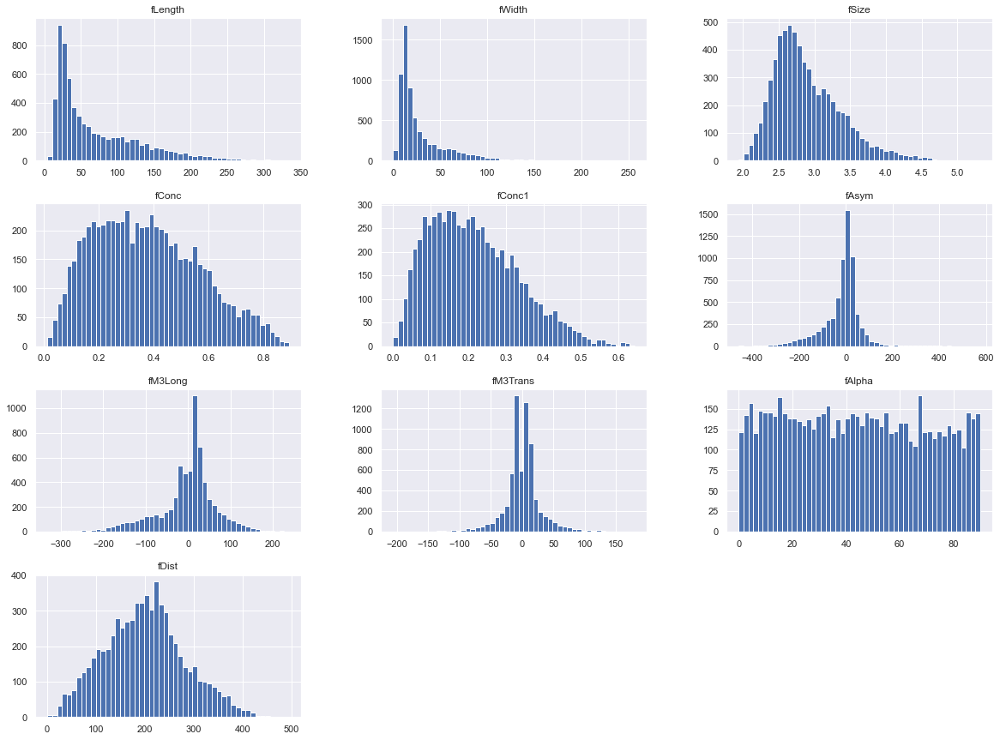

In [17]:
df_h.hist(bins = 50, figsize=(20,15))

<Figure size 432x288 with 0 Axes>

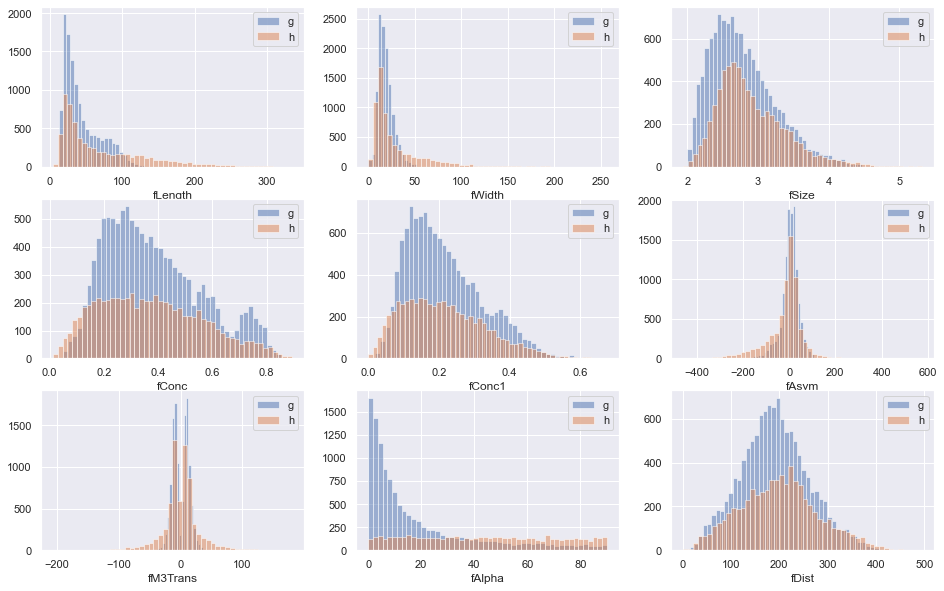

In [18]:
fig = plt.figure()
fig,ax=plt.subplots(3,3, figsize=(16.0, 10.0))
ax[0][0].hist(df_g['fLength'], bins=50, alpha=0.5 ,label='g')
ax[0][0].hist(df_h['fLength'], bins=50, alpha=0.5 ,label='h')
ax[0][0].set_xlabel('fLength')
ax[0][0].legend()

ax[0][1].hist(df_g['fWidth'], bins=50, alpha=0.5 ,label='g')
ax[0][1].hist(df_h['fWidth'], bins=50, alpha=0.5 ,label='h')
ax[0][1].set_xlabel('fWidth')
ax[0][1].legend()

ax[0][2].hist(df_g['fSize'], bins=50, alpha=0.5 ,label='g')
ax[0][2].hist(df_h['fSize'], bins=50, alpha=0.5 ,label='h')
ax[0][2].set_xlabel('fSize')
ax[0][2].legend()

ax[1][0].hist(df_g['fConc'], bins=50, alpha=0.5 ,label='g')
ax[1][0].hist(df_h['fConc'], bins=50, alpha=0.5 ,label='h')
ax[1][0].set_xlabel('fConc')
ax[1][0].legend()

ax[1][1].hist(df_g['fConc1'], bins=50, alpha=0.5 ,label='g')
ax[1][1].hist(df_h['fConc1'], bins=50, alpha=0.5 ,label='h')
ax[1][1].set_xlabel('fConc1')
ax[1][1].legend()

ax[1][2].hist(df_g['fAsym'], bins=50, alpha=0.5 ,label='g')
ax[1][2].hist(df_h['fAsym'], bins=50, alpha=0.5 ,label='h')
ax[1][2].set_xlabel('fAsym')
ax[1][2].legend()

ax[2][0].hist(df_g['fM3Trans'], bins=50, alpha=0.5 ,label='g')
ax[2][0].hist(df_h['fM3Trans'], bins=50, alpha=0.5 ,label='h')
ax[2][0].set_xlabel('fM3Trans')
ax[2][0].legend()

ax[2][1].hist(df_g['fAlpha'], bins=50, alpha=0.5 ,label='g')
ax[2][1].hist(df_h['fAlpha'], bins=50, alpha=0.5 ,label='h')
ax[2][1].set_xlabel('fAlpha')
ax[2][1].legend()

ax[2][2].hist(df_g['fDist'], bins=50, alpha=0.5 ,label='g')
ax[2][2].hist(df_h['fDist'], bins=50, alpha=0.5 ,label='h')
ax[2][2].set_xlabel('fDist')
ax[2][2].legend()
plt.show()

In [19]:
x = df.drop(['class'], axis = 1)
y = df['class']

In [20]:
le = LabelEncoder()
y = le.fit_transform(y)

In [21]:
y

array([0, 0, 0, ..., 1, 1, 1])

In [22]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

In [23]:
X_train

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist
1583,37.1464,21.6205,3.3506,0.2502,0.1296,2.7761,28.1556,-12.9581,1.7050,78.1894
1520,51.7656,30.7225,3.5780,0.1601,0.0871,38.2446,39.4275,14.3551,7.6181,197.2580
5453,33.3917,10.8839,2.4886,0.4578,0.2549,9.7498,-16.8504,10.1680,4.1160,117.8050
1617,20.8491,9.9287,2.3160,0.6039,0.3647,2.7306,-14.7746,-7.6769,65.8518,25.6525
491,25.5991,12.5304,2.6959,0.4995,0.3293,7.2105,-19.2635,-9.9130,8.7515,215.7070
...,...,...,...,...,...,...,...,...,...,...
11284,31.9212,16.7667,2.6566,0.3837,0.2348,3.7913,21.0170,3.4354,3.0450,249.3750
11964,43.4538,17.6541,2.9965,0.2621,0.1426,-12.4850,-23.2863,-11.3567,6.2607,184.7290
5390,19.9926,12.0866,2.4354,0.5725,0.3982,16.1410,16.3239,9.4374,12.7719,193.8930
860,31.4336,23.2651,2.9340,0.2957,0.1717,-9.1278,19.8518,19.2893,79.9590,23.2363


In [24]:
y_train

array([0, 0, 0, ..., 0, 0, 1])

In [25]:
X_test

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist
18749,48.0573,11.0862,2.9571,0.3620,0.1882,0.4200,32.4358,-2.2992,26.9300,165.2240
7051,23.4858,0.0000,2.2393,0.7378,0.3775,-2.9397,13.0915,0.0001,19.3410,235.3420
10901,40.5429,19.4073,3.3382,0.2369,0.1269,29.1908,27.0567,-7.1243,10.0643,195.6030
15858,16.6123,7.8423,2.5572,0.5829,0.3371,6.7271,-10.3448,-2.3240,14.5111,214.2655
17968,205.4250,37.7936,3.2727,0.2167,0.1257,46.0952,-210.9350,-29.7478,60.0580,206.1730
...,...,...,...,...,...,...,...,...,...,...
10013,50.1310,17.9673,3.0298,0.2232,0.1134,-13.9348,36.5453,3.0183,4.7341,242.5550
15490,41.1069,11.8791,2.7627,0.5625,0.3371,-44.9923,-22.7481,-9.2161,48.1747,178.4784
18280,50.4864,37.1735,2.9919,0.2409,0.1740,4.3727,-30.2334,21.8089,39.7134,201.8814
3946,25.8002,13.2023,2.3936,0.5010,0.2848,17.6722,14.3858,11.9903,12.5937,171.9250


In [26]:
y_test

array([1, 0, 0, ..., 1, 0, 0])

In [27]:
sc = StandardScaler()
X_train, X_test = sc.fit_transform(X_train), sc.transform(X_test)

In [28]:
X_train

array([[-0.38221692, -0.03260484,  1.10827529, ..., -0.62949999,
        -0.990935  , -1.54865045],
       [-0.03735598,  0.46489012,  1.58905227, ...,  0.68147498,
        -0.76461384,  0.04118375],
       [-0.47078875, -0.61944338, -0.71419509, ...,  0.48050317,
        -0.89865509, -1.01969289],
       ...,
       [-0.78686803, -0.55370649, -0.82667238, ...,  0.44543594,
        -0.56735454, -0.00374658],
       [-0.51697953,  0.05728532,  0.22748508, ...,  0.91830599,
         2.00420056, -2.28239821],
       [-0.05837666, -0.63625611, -0.63850548, ..., -0.63877797,
         1.22795852, -0.47723621]])

In [29]:
X_test

array([[-0.12483326, -0.60838612,  0.2763239 , ..., -0.11789567,
        -0.02545982, -0.38654235],
       [-0.70446488, -1.21433301, -1.24127382, ..., -0.00753421,
        -0.31592528,  0.549691  ],
       [-0.30209488, -0.1535734 ,  1.08205878, ..., -0.34949011,
        -0.67098667,  0.01908577],
       ...,
       [-0.06753178,  0.81748735,  0.34989927, ...,  1.03924138,
         0.46381888,  0.10291657],
       [-0.64986913, -0.49272482, -0.91504739, ...,  0.56796966,
        -0.57417506, -0.2970689 ],
       [ 0.83113017,  1.2663205 ,  1.21039283, ...,  2.49385473,
        -0.93585794,  1.26908375]])

# XGB Classifier

In [30]:
xgb = XGBClassifier(n_estimators = 10, random_state = 42)
xgb.fit(X_train, y_train)

[20:53:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=10, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [31]:
accuracies = {}

In [111]:
y_pred_XGB = xgb.predict(X_test)

In [112]:
confusion_matrix(y_test,y_pred_XGB)

array([[2933,  159],
       [ 475, 1188]], dtype=int64)

In [34]:
cm_XGB = confusion_matrix(y_test, y_pred_XGB)

<AxesSubplot:>

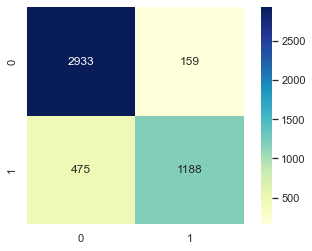

In [35]:
sns.heatmap(cm_XGB, square=True, cbar=True, annot=True, cmap='YlGnBu', fmt="d")

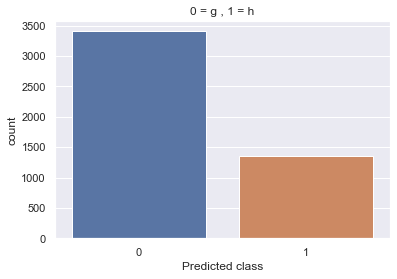

In [36]:
sns.countplot(y_pred_XGB, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

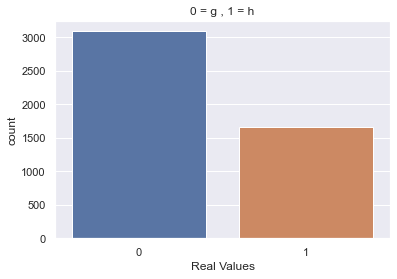

In [37]:
sns.countplot(y_test, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Real Values')
plt.show()

In [38]:
accuracies['XGB'] = accuracy_score(y_test, y_pred_XGB) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_XGB)*100))

Accuracy: 86.67%


In [39]:
print(classification_report(y_test, y_pred_XGB, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.86      0.95      0.90      3092
      hadron       0.88      0.71      0.79      1663

    accuracy                           0.87      4755
   macro avg       0.87      0.83      0.85      4755
weighted avg       0.87      0.87      0.86      4755



# Random Forest Classifier

In [40]:
rf = RandomForestClassifier(n_estimators=100, criterion='entropy',random_state=42)

In [41]:
rf.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', random_state=42)

In [42]:
y_pred_RF = rf.predict(X_test)

In [43]:
confusion_matrix(y_test, y_pred_RF)

array([[2911,  181],
       [ 414, 1249]], dtype=int64)

In [44]:
cm_rf = confusion_matrix(y_test, y_pred_RF)

<AxesSubplot:>

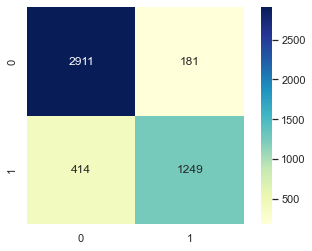

In [45]:
sns.heatmap(cm_rf, square=True, cbar=True, annot=True, cmap='YlGnBu', fmt="d")

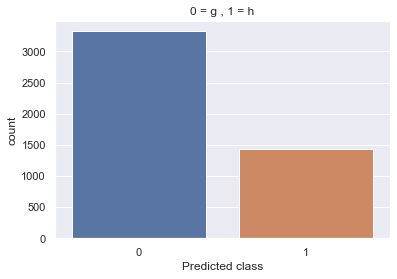

In [46]:
sns.countplot(y_pred_RF, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

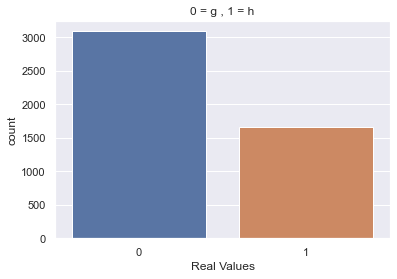

In [47]:
sns.countplot(y_test, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Real Values')
plt.show()

In [48]:
accuracies['RF'] = accuracy_score(y_test, y_pred_RF) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_RF)*100))

Accuracy: 87.49%


In [49]:
print(classification_report(y_test, y_pred_RF, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.88      0.94      0.91      3092
      hadron       0.87      0.75      0.81      1663

    accuracy                           0.87      4755
   macro avg       0.87      0.85      0.86      4755
weighted avg       0.87      0.87      0.87      4755



# Stochastic Gradient Descent Classifier

In [50]:
sgdc = SGDClassifier(random_state=42)

In [51]:
sgdc.fit(X_train, y_train)

SGDClassifier(random_state=42)

In [52]:
y_pred_SGDC = sgdc.predict(X_test)

In [53]:
confusion_matrix(y_test, y_pred_SGDC)

array([[2798,  294],
       [ 726,  937]], dtype=int64)

In [54]:
cm_sgdc = confusion_matrix(y_test, y_pred_SGDC)

<AxesSubplot:>

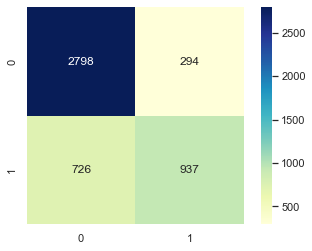

In [55]:
sns.heatmap(cm_sgdc, square=True, cbar=True, annot=True, cmap='YlGnBu', fmt="d")

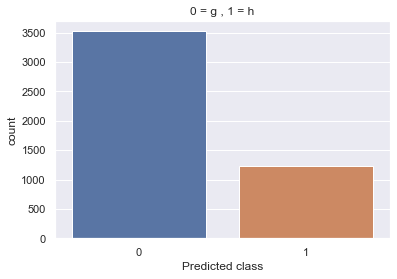

In [56]:
sns.countplot(y_pred_SGDC, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

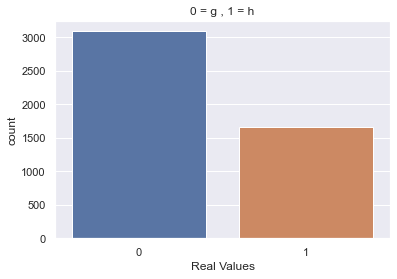

In [107]:
sns.countplot(y_test, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

In [58]:
accuracies['SGDC'] = accuracy_score(y_test, y_pred_SGDC) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_SGDC)*100))

Accuracy: 78.55%


In [59]:
print(classification_report(y_test, y_pred_SGDC, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.79      0.90      0.85      3092
      hadron       0.76      0.56      0.65      1663

    accuracy                           0.79      4755
   macro avg       0.78      0.73      0.75      4755
weighted avg       0.78      0.79      0.78      4755



# Support Vector Machine

In [60]:
svc = SVC(C = 57, random_state = 42)

In [61]:
svc.fit(X_train, y_train)

SVC(C=57, random_state=42)

In [62]:
y_pred_SVC = svc.predict(X_test)

In [63]:
confusion_matrix(y_test, y_pred_SVC)

array([[2969,  123],
       [ 446, 1217]], dtype=int64)

In [64]:
cm_svc = confusion_matrix(y_test, y_pred_SVC)

<AxesSubplot:>

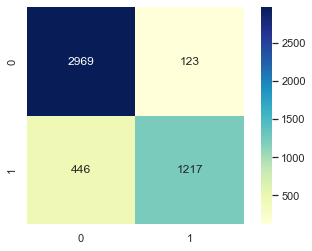

In [65]:
sns.heatmap(cm_svc, square=True, cbar=True, annot=True, cmap='YlGnBu', fmt="d")

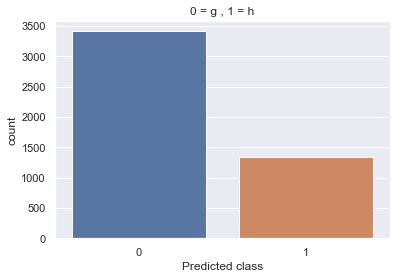

In [66]:
sns.countplot(y_pred_SVC, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

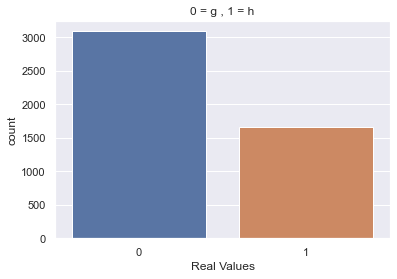

In [106]:
sns.countplot(y_test, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

In [68]:
accuracies['SVC'] = accuracy_score(y_test, y_pred_SVC) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_SVC)*100))

Accuracy: 88.03%


In [69]:
print(classification_report(y_test, y_pred_SVC, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.87      0.96      0.91      3092
      hadron       0.91      0.73      0.81      1663

    accuracy                           0.88      4755
   macro avg       0.89      0.85      0.86      4755
weighted avg       0.88      0.88      0.88      4755



# Decision Tree Classification

In [70]:
dtc = DecisionTreeClassifier(criterion='entropy', random_state=42)

In [71]:
dtc.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [72]:
y_pred_DTC = dtc.predict(X_test)

In [73]:
confusion_matrix(y_test, y_pred_DTC)

array([[2673,  419],
       [ 439, 1224]], dtype=int64)

In [74]:
cm_dtc = confusion_matrix(y_test, y_pred_DTC)

<AxesSubplot:>

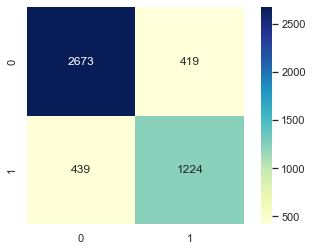

In [75]:
sns.heatmap(cm_dtc, square=True, cbar=True, annot=True, cmap='YlGnBu', fmt="d")

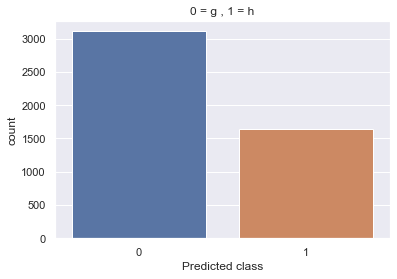

In [76]:
sns.countplot(y_pred_DTC, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

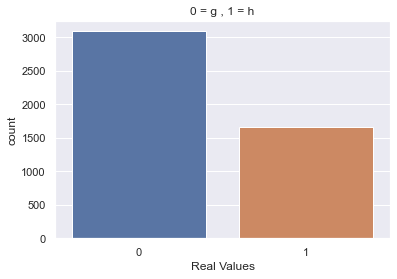

In [104]:
sns.countplot(y_test, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

In [92]:
accuracies['DTC'] = accuracy_score(y_test, y_pred_DTC) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_DTC)*100))

Accuracy: 81.96%


In [79]:
print(classification_report(y_test, y_pred_DTC, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.86      0.86      0.86      3092
      hadron       0.74      0.74      0.74      1663

    accuracy                           0.82      4755
   macro avg       0.80      0.80      0.80      4755
weighted avg       0.82      0.82      0.82      4755



# Neural Network

In [80]:
nn = tf.keras.models.Sequential([
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(2, activation='sigmoid'),
])

nn.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [81]:
x_train_nn, x_cv_nn, y_train_nn, y_cv_nn = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

In [82]:
num_epochs = 6
history = nn.fit(
    x_train_nn, y_train_nn, epochs=num_epochs,
    validation_data=(x_cv_nn, y_cv_nn),
    steps_per_epoch=X_train.shape[0] // num_epochs,
    callbacks=[
        tf.keras.callbacks.ReduceLROnPlateau(patience=2, verbose=2)
    ]
)

Epoch 1/6
2377/2377 [==============================] - 8s 2ms/step - loss: 0.3939 - accuracy: 0.8341 - val_loss: 0.3380 - val_accuracy: 0.8626 - lr: 0.0010
Epoch 2/6
2377/2377 [==============================] - 5s 2ms/step - loss: 0.3490 - accuracy: 0.8560 - val_loss: 0.3426 - val_accuracy: 0.8677 - lr: 0.0010
Epoch 3/6
2359/2377 [============================>.] - ETA: 0s - loss: 0.3433 - accuracy: 0.8551
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
2377/2377 [==============================] - 5s 2ms/step - loss: 0.3434 - accuracy: 0.8551 - val_loss: 0.3427 - val_accuracy: 0.8615 - lr: 0.0010
Epoch 4/6
2377/2377 [==============================] - 5s 2ms/step - loss: 0.3194 - accuracy: 0.8691 - val_loss: 0.3167 - val_accuracy: 0.8719 - lr: 1.0000e-04
Epoch 5/6
2377/2377 [==============================] - 5s 2ms/step - loss: 0.3092 - accuracy: 0.8692 - val_loss: 0.3165 - val_accuracy: 0.8750 - lr: 1.0000e-04
Epoch 6/6
2377/2377 [===========================

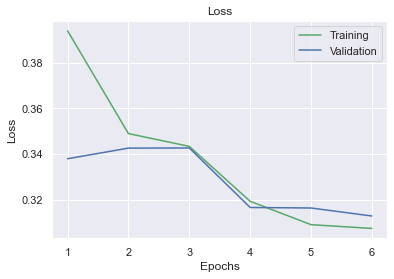

In [83]:
loss_train = history.history['loss']
loss_validation = history.history['val_loss']
epochs = range(1, num_epochs + 1)
plt.plot(epochs, loss_train, 'g', label='Training')
plt.plot(epochs, loss_validation, 'b', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss')
plt.legend()
plt.show()

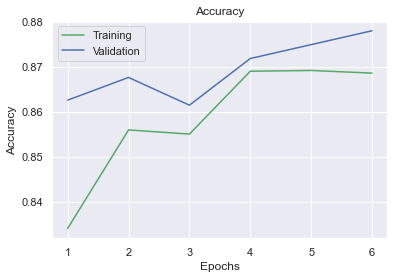

In [84]:
acc_train = history.history['accuracy']
acc_validation = history.history['val_accuracy']
epochs = range(1, num_epochs + 1)
plt.plot(epochs, acc_train, 'g', label='Training')
plt.plot(epochs, acc_validation, 'b', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy')
plt.legend()
plt.show()

In [85]:
y_pred_nn = nn.predict(X_test)
y_pred_NN = [np.argmax(y) for y in y_pred_nn]

In [86]:
confusion_matrix(y_test, y_pred_NN)

array([[2902,  190],
       [ 421, 1242]], dtype=int64)

<AxesSubplot:>

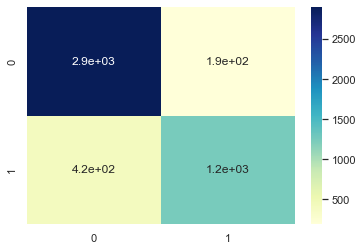

In [87]:
sns.heatmap(confusion_matrix(y_test, y_pred_NN), cmap='YlGnBu', annot=True)

In [88]:
accuracies['NN'] = accuracy_score(y_test, y_pred_NN) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_NN)*100))
# print(f"Accuracy: {accuracies['NN']:.2f}%)...Other way to print Accuracy

Accuracy: 87.15%


In [89]:
print(classification_report(y_test, y_pred_NN, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.87      0.94      0.90      3092
      hadron       0.87      0.75      0.80      1663

    accuracy                           0.87      4755
   macro avg       0.87      0.84      0.85      4755
weighted avg       0.87      0.87      0.87      4755



# K Neighbors Classifier

In [94]:
knn = KNeighborsClassifier()

In [95]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [108]:
y_pred_KNN = knn.predict(X_test)

In [97]:
confusion_matrix(y_test, y_pred_KNN)

array([[2893,  199],
       [ 592, 1071]], dtype=int64)

In [98]:
cm_knn = confusion_matrix(y_test, y_pred_KNN)

<AxesSubplot:>

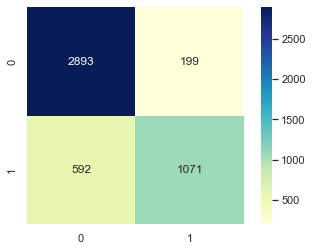

In [99]:
sns.heatmap(cm_knn, square=True, cbar=True, annot=True, cmap='YlGnBu', fmt="d")

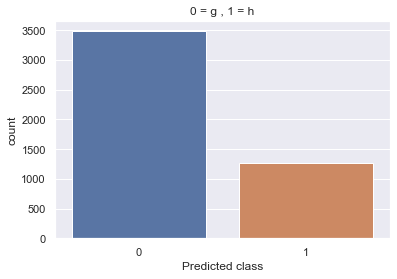

In [100]:
sns.countplot(y_pred_KNN, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

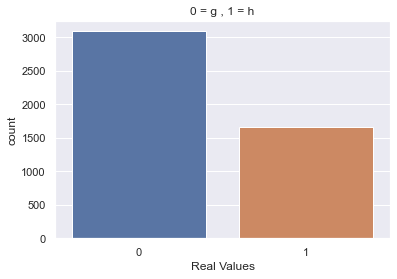

In [101]:
sns.countplot(y_test, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Real Values')
plt.show()

In [102]:
accuracies['KNN'] = accuracy_score(y_test, y_pred_KNN) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_KNN)*100))

Accuracy: 83.36%


In [103]:
print(classification_report(y_test, y_pred_KNN, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.83      0.94      0.88      3092
      hadron       0.84      0.64      0.73      1663

    accuracy                           0.83      4755
   macro avg       0.84      0.79      0.81      4755
weighted avg       0.83      0.83      0.83      4755



# Naive Bayes Classifier

In [115]:
nbc = GaussianNB()

In [116]:
nbc.fit(X_train, y_train)

GaussianNB()

In [117]:
y_pred_NBC = nbc.predict(X_test)

In [118]:
confusion_matrix(y_test, y_pred_NBC)

array([[2847,  245],
       [1038,  625]], dtype=int64)

In [119]:
cm_nbc = confusion_matrix(y_test, y_pred_NBC)

<AxesSubplot:>

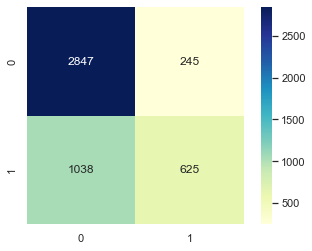

In [120]:
sns.heatmap(cm_nbc, square=True, cbar=True, annot=True, cmap='YlGnBu', fmt="d")

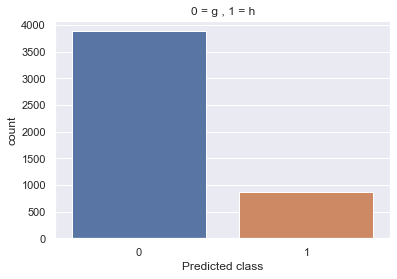

In [121]:
sns.countplot(y_pred_NBC, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

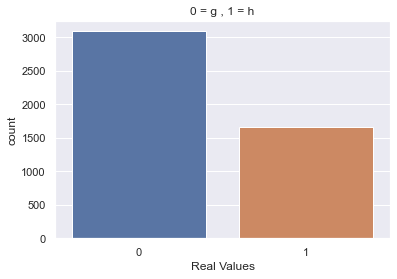

In [122]:
sns.countplot(y_test, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Real Values')
plt.show()

In [123]:
accuracies['NBC'] = accuracy_score(y_test, y_pred_NBC) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_NBC)*100))

Accuracy: 73.02%


In [124]:
print(classification_report(y_test, y_pred_NBC, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.73      0.92      0.82      3092
      hadron       0.72      0.38      0.49      1663

    accuracy                           0.73      4755
   macro avg       0.73      0.65      0.65      4755
weighted avg       0.73      0.73      0.70      4755



# Perceptron

In [135]:
ptron = Perceptron()

In [136]:
ptron.fit(X_train, y_train)

Perceptron()

In [145]:
y_pred_Ptron =ptron.predict(X_test)

In [138]:
confusion_matrix(y_test, y_pred_Ptron)

array([[2647,  445],
       [ 940,  723]], dtype=int64)

In [140]:
cm_ptron = confusion_matrix(y_test, y_pred_Ptron)

<AxesSubplot:>

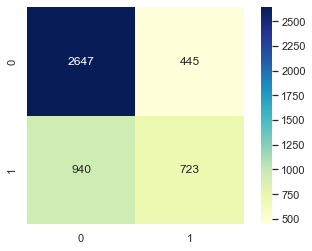

In [141]:
sns.heatmap(cm_ptron, square=True, cbar=True, annot=True, cmap='YlGnBu', fmt="d")

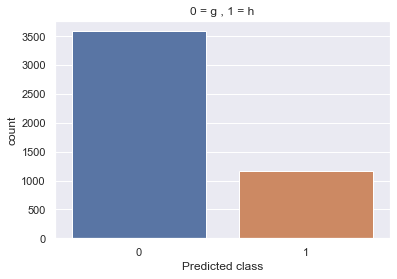

In [142]:
sns.countplot(y_pred_Ptron, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

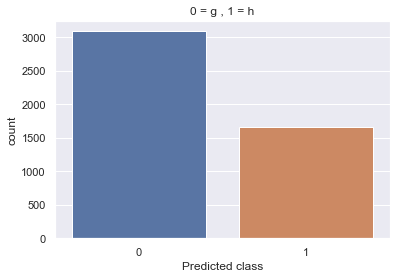

In [134]:
sns.countplot(y_test, data=df)
plt.title('0 = g , 1 = h')
plt.xlabel('Predicted class')
plt.show()

In [143]:
accuracies['Ptron'] = accuracy_score(y_test, y_pred_Ptron) * 100
print("Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_Ptron)*100))

Accuracy: 70.87%


In [144]:
print(classification_report(y_test, y_pred_Ptron, target_names=['gamma', 'hadron']))

              precision    recall  f1-score   support

       gamma       0.74      0.86      0.79      3092
      hadron       0.62      0.43      0.51      1663

    accuracy                           0.71      4755
   macro avg       0.68      0.65      0.65      4755
weighted avg       0.70      0.71      0.69      4755



# Result

In [148]:
accuracies

{'XGB': 86.66666666666667,
 'RF': 87.48685594111461,
 'SGDC': 78.54889589905363,
 'SVC': 88.03364879074658,
 'DTC': 81.9558359621451,
 'NN': 87.15036803364879,
 'KNN': 83.36487907465825,
 'NBC': 73.01787592008412,
 'Ptron': 70.87276550998949}

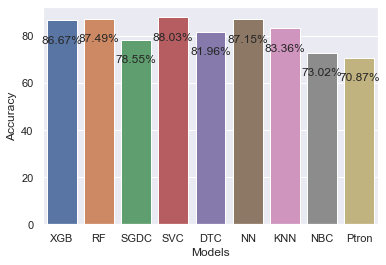

In [150]:
ax = sns.barplot(list(accuracies.keys()), list(accuracies.values()))
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():2.2f}%',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha = 'center', va = 'center',
        xytext = (0, -20), textcoords = 'offset points'
    )
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.show()